Мы будем предсказывать расположение и класс дефектов, обнаруженных на производстве стальных листов. Изображения имеют уникальные названия ImageId. Целью является сегментировать и классифицировать дефекты по изображениям из test датасета.<br>
Каждое изображение может вообще не иметь дефектов, иметь дефект только одного класса или дефекты нескольких классов. Для каждого изображения нужно сегментировать дефекты каждого класса (ClassId = [1, 2, 3, 4])<br>
Сегмент для дефекта каждого класса должен быть записан в отдельную строку, даже если на изображении присутствуют несколько дискретных расположений дефекта


**Файлы** <br>
- train_images/ - папка изображений для тренировки модели <br>
- test_images/ - папка изображений для тестирования модели (мы сегментируем и классифицируем эти изображения)<br>
- train.csv - аннотации с сегментами дефектов на изображениях из тренировочного датасета (ClassId = [1, 2, 3, 4])<br>
- sample_submission.csv - a sample submission file in the correct format; <br>


*note, each ImageId 4 rows, one for each of the 4 defect classes*

Пиксели номируются сверху вниз, потом слева направо, то есть 1й пиксель это $(0,0)$, 2й пиксель это $(1,0)$.<br>
То есть если на картинке пиксель $(i,j)$, где $i$ - номер строки, $j$ - номер столбца, то его номер $n$ вычисляется по формуле $n = 256* j + i + 1$<br>
Формула для вычисления i, j по порядковому номеру n:<br>
$j = int(n/256)$<br>
$i = n - 256*int(n/256) - 1 = n - 256*j -1$

In [6]:
import warnings
warnings.filterwarnings('ignore')

In [7]:
%pip install opencv-python
%pip install plotly
%pip install -U protobuf==3.11.3
%pip install seaborn
%pip install imageio

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [8]:
%pip install tensorflow h5py==2.10.0

Defaulting to user installation because normal site-packages is not writeable


In [4]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O
import matplotlib.pyplot as plt # Import matplotlib for data visualisation
import seaborn as sns
#import pandas_profiling as pp
import os
from collections import defaultdict
import imageio
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import plotly
from plotly import graph_objects as go
import plotly.express as px

In [10]:
print(os.listdir("data"))

['sample_submission.csv', 'train_images', 'train.csv', 'test_images', '.ipynb_checkpoints']


In [11]:
print(os.listdir("data"))
for dirname, _, filenames in os.walk('data'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

['sample_submission.csv', 'train_images', 'train.csv', 'test_images', '.ipynb_checkpoints']
data/sample_submission.csv
data/train.csv
data/train_images/207e88d4a.jpg
data/train_images/8366a9a39.jpg
data/train_images/4edc8b817.jpg
data/train_images/3c0b4c0b0.jpg
data/train_images/0c3fdad18.jpg
data/train_images/2d8146e53.jpg
data/train_images/9a18e4457.jpg
data/train_images/5457b2b87.jpg
data/train_images/87e6e09c4.jpg
data/train_images/30fd94c0e.jpg
data/train_images/737e2554e.jpg
data/train_images/160391fb1.jpg
data/train_images/76adc6361.jpg
data/train_images/80385ffeb.jpg
data/train_images/1cb83b95a.jpg
data/train_images/0e650e720.jpg
data/train_images/0ba4c4183.jpg
data/train_images/71f687e7d.jpg
data/train_images/25515c2f6.jpg
data/train_images/6109c07c7.jpg
data/train_images/421c3f368.jpg
data/train_images/000418bfc.jpg
data/train_images/662e5a5ee.jpg
data/train_images/3c8b6c978.jpg
data/train_images/744e852d6.jpg
data/train_images/6a9ff4b0c.jpg
data/train_images/06e6e7a8c.jpg
da

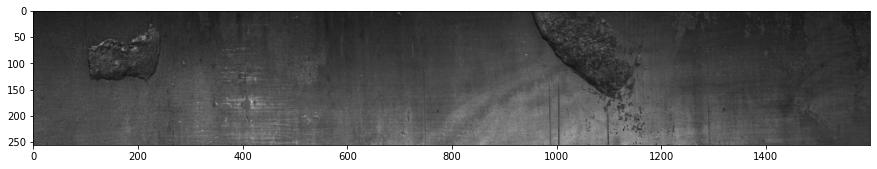

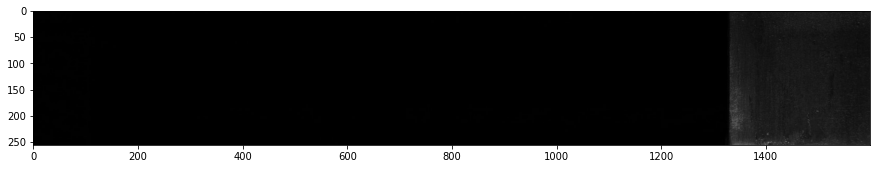

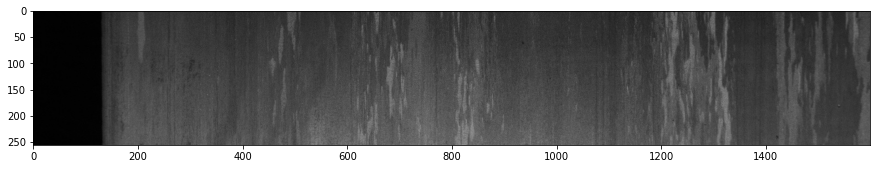

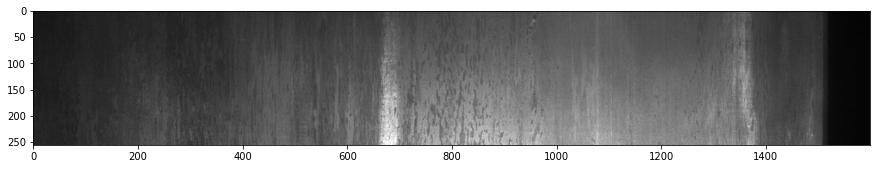

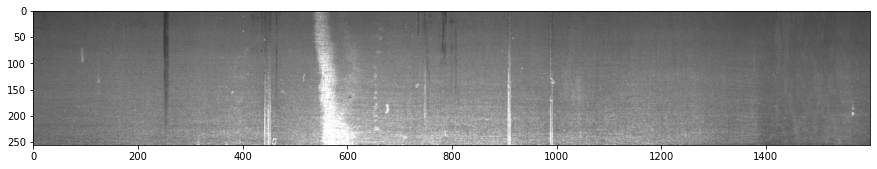

...

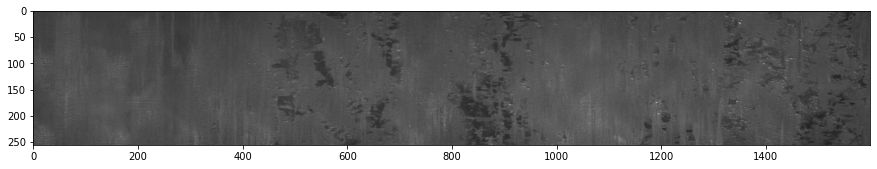

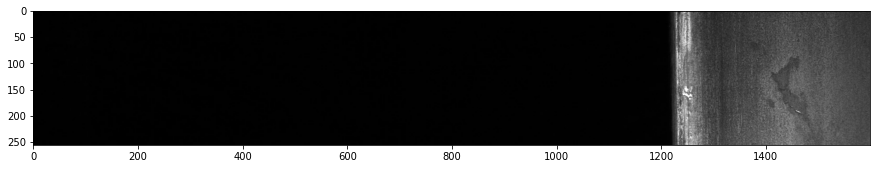

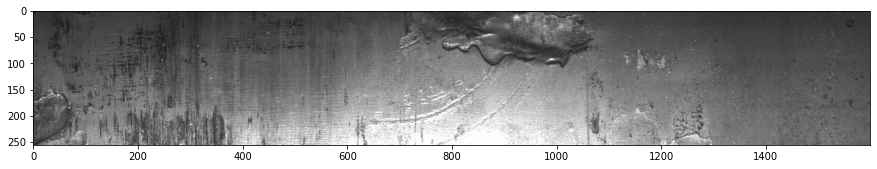

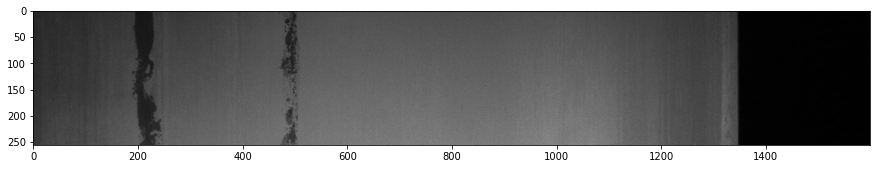

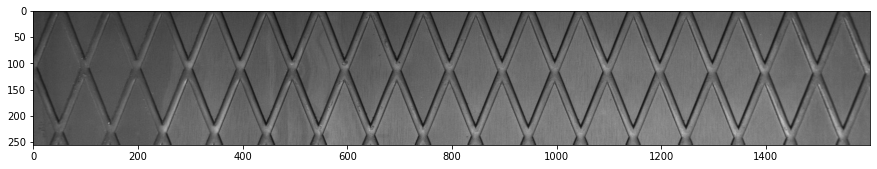

data/train_images/4edc8b817.jpg
(256, 1600, 3)
data/train_images/3c0b4c0b0.jpg
(256, 1600, 3)
data/train_images/0c3fdad18.jpg
(256, 1600, 3)
data/train_images/2d8146e53.jpg
(256, 1600, 3)
data/train_images/9a18e4457.jpg
(256, 1600, 3)
data/train_images/5457b2b87.jpg
(256, 1600, 3)
data/train_images/87e6e09c4.jpg
(256, 1600, 3)
data/train_images/30fd94c0e.jpg
(256, 1600, 3)
data/test_images/fe03f768e.jpg
(256, 1600, 3)
data/test_images/c031250e1.jpg
(256, 1600, 3)
data/test_images/adf355c9f.jpg
(256, 1600, 3)
data/test_images/cc9ddbc17.jpg
(256, 1600, 3)
data/test_images/8058b2dd2.jpg
(256, 1600, 3)
data/test_images/73f9579dd.jpg
(256, 1600, 3)
data/test_images/9b4e0f08d.jpg
(256, 1600, 3)
data/test_images/04ac89bbc.jpg
(256, 1600, 3)


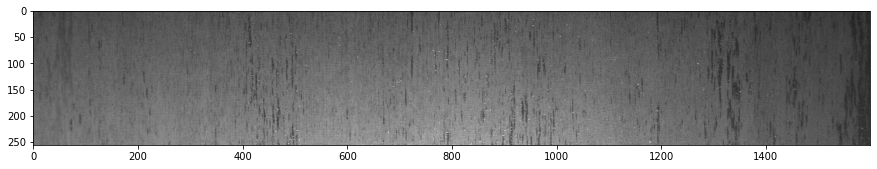

In [12]:
#lets have a look at some images
for dirname, _, filenames in os.walk('data'):
    for filename in filenames[2:10]:
        print(os.path.join(dirname, filename))
        im1 = imageio.imread(os.path.join(dirname, filename)) #Read the image from the desktop
        print(im1.shape) #Returns the number of rows, columns and channels (if image is color returns "3")
        plt.figure(figsize=(15,10))
        plt.imshow(im1)
        plt.show()

In [5]:
data_dir ="data"
input_file0 = "train.csv"
input_file1 = "sample_submission.csv"
abspath='/'.join(os.getcwd().split('\\')) 
source_folder = os.path.join(abspath, 'data')
df_train = pd.read_csv(os.path.join(source_folder,input_file0))
df_sample = pd.read_csv(os.path.join(source_folder,input_file1))

In [14]:
df_train.head()

,ImageId,ClassId,EncodedPixels
0,0002cc93b.jpg,1,29102 12 29346 24 29602 24 29858 24 30114 24 3...
1,0007a71bf.jpg,3,18661 28 18863 82 19091 110 19347 110 19603 11...
2,000a4bcdd.jpg,1,37607 3 37858 8 38108 14 38359 20 38610 25 388...
3,000f6bf48.jpg,4,131973 1 132228 4 132483 6 132738 8 132993 11 ...
4,0014fce06.jpg,3,229501 11 229741 33 229981 55 230221 77 230468...


In [15]:
df_train.shape

(7095, 3)

In [16]:
# Пути на папки с train_images и test_images соответственно
trainImgPath =os.path.join(source_folder,'train_images/')
testImgPath = os.path.join(source_folder,'test_images/')

In [17]:
# Создадим таблицу с ImageId из папки train_images
# Каждому ImageId будут соответствовать 4 строки (для каждого класса дефекта)
train_Img_Id = []
train_class_Id = []
for i in os.listdir(trainImgPath):
    for j in range(1,5):
        train_Img_Id.append(i)
        train_class_Id.append(j)
train_Imgs = pd.DataFrame(train_Img_Id,columns=['ImageId'])
train_Imgs['ClassId'] = train_class_Id
train_Imgs.head(10)

,ImageId,ClassId
0,207e88d4a.jpg,1
1,207e88d4a.jpg,2
2,207e88d4a.jpg,3
3,207e88d4a.jpg,4
4,8366a9a39.jpg,1
5,8366a9a39.jpg,2
6,8366a9a39.jpg,3
7,8366a9a39.jpg,4
8,4edc8b817.jpg,1
9,4edc8b817.jpg,2


In [18]:
# Создадим таблицу - объединение 2х таблиц train_Img, df_train
# Nan значения заменим пустыми строками
train_d = pd.merge(train_Imgs, df_train,how='left', on=['ImageId','ClassId']) 
train_d = train_d.fillna('') 
train_d.head(10)

,ImageId,ClassId,EncodedPixels
0,207e88d4a.jpg,1,
1,207e88d4a.jpg,2,
2,207e88d4a.jpg,3,272641 89 272897 177 273153 177 273409 177 273...
3,207e88d4a.jpg,4,
4,8366a9a39.jpg,1,
5,8366a9a39.jpg,2,
6,8366a9a39.jpg,3,
7,8366a9a39.jpg,4,
8,4edc8b817.jpg,1,
9,4edc8b817.jpg,2,


In [19]:
train_d.shape

(31488, 3)

In [20]:
# Изменим структуру таблицы:
# каждому ImageId отвечает одна строка, а столбцы - это дефекты различных классов, если дефект какого-либо класса отсутствует, 
# то в соответствующем столбце - пустое значение
train_data = pd.pivot_table(train_d, values='EncodedPixels', index='ImageId',columns='ClassId', aggfunc=np.sum).astype(str)
train_data = train_data.reset_index() # add Index column to one level with classID   
train_data.columns = ['ImageId','Defect_1','Defect_2','Defect_3','Defect_4']
train_data.columns
train_data = train_data.replace({'nan':''})

In [21]:
print(train_data.shape)
print(len(np.unique(train_data.ImageId.values)))

(7872, 5)
7872


In [22]:
train_data.head()

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4
0,0002cc93b.jpg,29102 12 29346 24 29602 24 29858 24 30114 24 3...,,,
1,00031f466.jpg,,,,
2,000418bfc.jpg,,,,
3,000789191.jpg,,,,
4,0007a71bf.jpg,,,18661 28 18863 82 19091 110 19347 110 19603 11...,


In [23]:
# Добавим колонки: 
# has_defect - индификатор наличия дефекта какого-либо класса, 
has_defect = []
for index,row in train_data.iterrows():
    if row.Defect_1 or row.Defect_2 or row.Defect_3 or row.Defect_4: 
        has_defect.append(1)
    else:
        has_defect.append(0)
        
train_data["has_defect"] = has_defect 
number_of_defects=[]
for index, row in train_data.iterrows():
    i=0
    if row.Defect_1:
        i=i+1
    if row.Defect_2:
        i=i+1
    if row.Defect_3:
        i=i+1
    if row.Defect_4:
        i=i+1
    number_of_defects.append(i)
        
train_data["number_of_defects"] = number_of_defects  
train_data.head(5)

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4,has_defect,number_of_defects
0,0002cc93b.jpg,29102 12 29346 24 29602 24 29858 24 30114 24 3...,,,,1,1
1,00031f466.jpg,,,,,0,0
2,000418bfc.jpg,,,,,0,0
3,000789191.jpg,,,,,0,0
4,0007a71bf.jpg,,,18661 28 18863 82 19091 110 19347 110 19603 11...,,1,1


In [24]:
#Number of images with defects of several classes
train_data["number_of_defects"].value_counts()

1    3909
0    3721
2     242
Name: number_of_defects, dtype: int64

Text(0.5, 0, 'Number of classes')

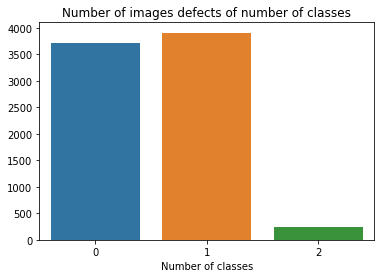

In [25]:
fig, ax = plt.subplots()
sns.barplot(x=list(train_data["number_of_defects"].value_counts().index), y=list(train_data["number_of_defects"].value_counts().values), ax=ax)
ax.set_title("Number of images defects of number of classes")
ax.set_xlabel("Number of classes")

Большинство изображений имеют дефекты одного класса (3909 экземпляров), дефекты двух классов имеют 242 изображений и нет ни одного изображающего, содержащего дефекты трех или всех четырех классов.

In [26]:
# Number of images for each class
class_count={}
class_count['1'] = train_data[train_data['Defect_1']!=''].shape[0]
class_count['2'] = train_data[train_data['Defect_2']!=''].shape[0]
class_count['3'] = train_data[train_data['Defect_3']!=''].shape[0]
class_count['4'] = train_data[train_data['Defect_4']!=''].shape[0]
print('Class 1 ', class_count['1'])
print('Class 2 ', class_count['2'])
print('Class 3 ', class_count['3'])
print('Class 4 ', class_count['4'])

Class 1  550
Class 2  143
Class 3  3220
Class 4  480


{'1': 550, '2': 143, '3': 3220, '4': 480}

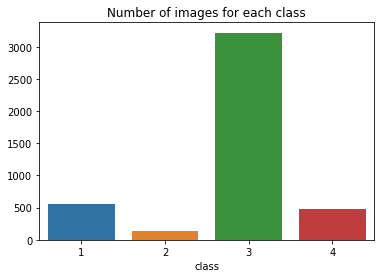

In [27]:
fig, ax = plt.subplots()
sns.barplot(x=list(class_count.keys()), y=list(class_count.values()), ax=ax)
ax.set_title("Number of images for each class")
ax.set_xlabel("class")
class_count

Преобладающим классом дефектов является класс 3, так как его содержат 3220 изображений. На втором месте находится класс 1 с 550 изображениями, на третьем - класс 4 (480 изображение). Меньше всего изображений, содержащих дефекты класса 2 - 143 изображения.

In [28]:
train_data.shape

(7872, 7)

In [29]:
train_data.has_defect.value_counts()

1    4151
0    3721
Name: has_defect, dtype: int64

In [30]:
def mask_to_rle(mask):
    """
    params:  mask - numpy array
    returns: run-length encoding string (pairs of start & length of encoding)
    """
    
    # turn a n-dimensional array into a 1-dimensional series of pixels
    # for example:
    #     [[1. 1. 0.]
    #      [0. 0. 0.]   --> [1. 1. 0. 0. 0. 0. 1. 0. 0.]
    #      [1. 0. 0.]]
    flat = mask.flatten()
    
    # we find consecutive sequences by overlaying the mask
    # on a version of itself that is displaced by 1 pixel
    # for that, we add some padding before slicing
    padded = np.concatenate([[0], flat, [0]])
    
    # this returns the indices where the sliced arrays differ
    runs = np.where(padded[1:] != padded[:-1])[0] 
    # indexes start at 0, pixel numbers start at 1
    runs += 1

    # every uneven element represents the start of a new sequence
    # every even element is where the run comes to a stop
    # subtract the former from the latter to get the length of the run
    runs[1::2] -= runs[0::2]
 
    # convert the array to a string
    return ' '.join(str(x) for x in runs)

In [31]:
a=np.array([[0., 0., 1.],[0., 1., 0.],[0., 0., 1.]])
a

array([[0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.]])

In [32]:
mask_to_rle(a)

'3 1 5 1 9 1'

In [33]:
def rle_to_mask(lre, shape=(1600, 256)):
    '''
    params:  rle   - run-length encoding string (pairs of start & length of encoding)
             shape - (width,height) of numpy array to return 
    
    returns: numpy array with dimensions of shape parameter
    '''    
    h, w = shape
    if len(lre)>0:# the incoming string is space-delimited
        runs = np.asarray([int(run) for run in lre.split(' ')])

        # we do the same operation with the even and uneven elements, but this time with addition
        runs[1::2] += runs[0::2]
        # pixel numbers start at 1, indexes start at 0
        runs -= 1

        # extract the starting and ending indeces at even and uneven intervals, respectively
        run_starts, run_ends = runs[0::2], runs[1::2]

        # build the mask
        mask = np.zeros(h*w, dtype=np.uint8)
        for start, end in zip(run_starts, run_ends):
            mask[start:end] = 1
    elif len(lre)==0:
        mask = np.zeros(h*w, dtype=np.uint8)
    # transform the numpy array from flat to the original image shape
    return mask.reshape(shape).T

In [34]:
rle_to_mask('3 3 7 2', shape=(3, 3))

array([[0, 1, 1],
       [0, 1, 1],
       [1, 0, 0]], dtype=uint8)

In [35]:
rle_to_mask('', shape=(3, 3))

array([[0, 0, 0],
       [0, 0, 0],
       [0, 0, 0]], dtype=uint8)

In [36]:
def load_img(img_id):
    img_dir='train_images' 
    img = cv2.imread(os.path.join(os.path.join(data_dir,img_dir), img_id))
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    return img

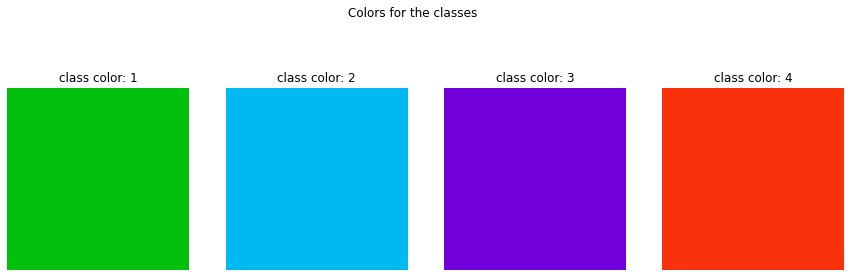

In [37]:
rgb_for_label = {i:v for i, v in enumerate([(0, 192, 12), (0, 185, 241), (114, 0, 218), (249,50,12)], start=1)}

    
fig, ax = plt.subplots(1, 4, figsize=(15, 5))
for i in range(0, 4):
    ax[i].axis('off')
    ax[i].imshow(np.ones((50, 50, 3), dtype=np.uint8) * rgb_for_label[i+1])
    ax[i].set_title("class color: {}".format(i+1))
fig.suptitle("Colors for the classes")

plt.show()


In [38]:
def show_masked_image(img_id, ax=None, thickness=2):
    if ax is None:
        fig, ax = plt.subplots(figsize=(15, 5))
    
    img = load_img(img_id)
    for i, col in df_train[df_train['ImageId'] == img_id].iterrows():
        encoded_pixels = col['EncodedPixels']
        label = col['ClassId']
        mask = rle_to_mask(encoded_pixels, shape=(1600, 256))
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        img = cv2.drawContours(img, contours, -1, rgb_for_label[label], thickness=thickness)
    ax.imshow(img)
    return ax

#def show_masked_images_per_class(label, num_images=5):

    #num_imgs = 5
    #fig, axs = plt.subplots(nrows=num_imgs, ncols=1, figsize=(15, 15))
    #axs = axs.ravel()
    
    #image_ids = np.asarray(train_data[train_data['Defect_1']!='']['ImageId'].values)
    #random_ids = list(image_ids)[:5]
    
    #for i, img_id in enumerate(image_ids[random_ids]):
        #show_masked_image(img_id, ax=axs[i])
        

<AxesSubplot:>

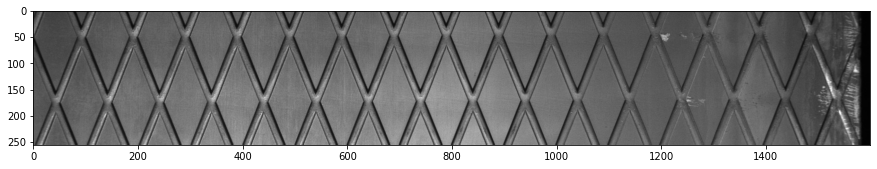

In [39]:
#Без дефектов
show_masked_image('000789191.jpg')

<AxesSubplot:>

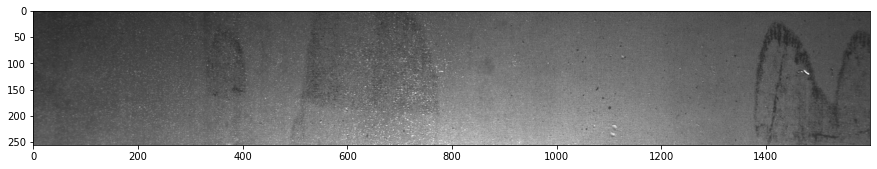

In [40]:
show_masked_image('001982b08.jpg')

## Аналитика изображений с дефектами 

In [41]:
#Первые 10 изображений с дефектами класса 1
train_data[train_data['Defect_1']!=''].head(10)

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4,has_defect,number_of_defects
0,0002cc93b.jpg,29102 12 29346 24 29602 24 29858 24 30114 24 3...,,,,1,1
5,000a4bcdd.jpg,37607 3 37858 8 38108 14 38359 20 38610 25 388...,,,,1,1
14,002fc4e19.jpg,146021 3 146275 10 146529 40 146783 46 147038 ...,145658 7 145901 20 146144 33 146386 47 146629 ...,,,1,2
34,008ef3d74.jpg,356336 4 356587 11 356838 18 357089 25 357340 ...,375439 5 375687 14 375935 24 376182 34 376430 ...,,,1,2
37,00ac8372f.jpg,101742 3 101998 12 102253 19 102301 22 102509 ...,98114 24 98370 72 98626 119 98881 168 99137 19...,,,1,2
40,00bc01bfe.jpg,212941 6 213193 18 213446 25 213701 26 213956 ...,,,,1,1
44,00c88fed0.jpg,10474 7 10728 15 10983 18 11239 21 11494 24 11...,13428 8 13684 24 13940 39 14196 55 14452 71 14...,,,1,2
59,01053d28f.jpg,43063 3 43319 8 43575 13 43831 18 44087 23 443...,,,,1,1
60,010db68d1.jpg,58330 13 58586 25 58842 25 59098 25 59354 25 5...,,,,1,1
62,012a9a4c7.jpg,176752 4 176996 17 177251 19 177506 21 177761 ...,,,,1,1


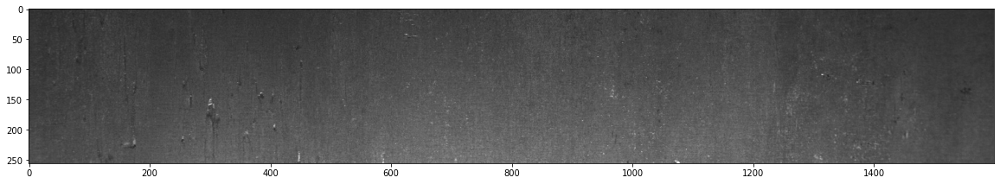

<AxesSubplot:>

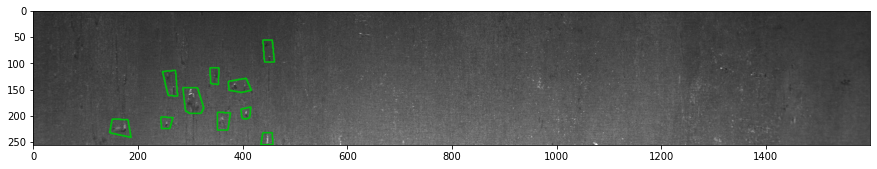

In [42]:
#Пример изображения с дефектом класса 1
filename='000a4bcdd.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
show_masked_image(filename)

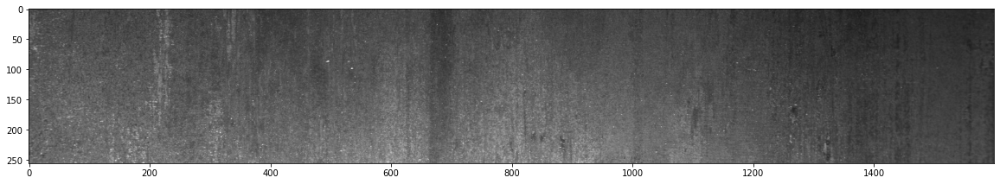

<AxesSubplot:>

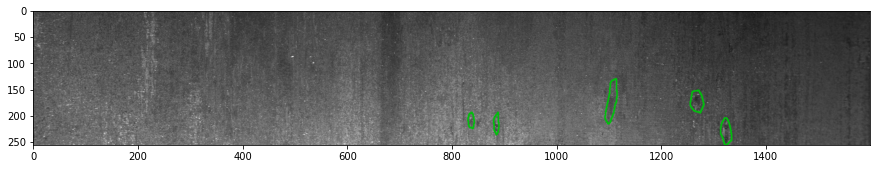

In [43]:
filename='00bc01bfe.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
plt.show()
show_masked_image(filename)

In [44]:
#Первые 10 изображений с дефектами класса 2
train_data[train_data['Defect_2']!=''].head(10)

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4,has_defect,number_of_defects
14,002fc4e19.jpg,146021 3 146275 10 146529 40 146783 46 147038 ...,145658 7 145901 20 146144 33 146386 47 146629 ...,,,1,2
34,008ef3d74.jpg,356336 4 356587 11 356838 18 357089 25 357340 ...,375439 5 375687 14 375935 24 376182 34 376430 ...,,,1,2
37,00ac8372f.jpg,101742 3 101998 12 102253 19 102301 22 102509 ...,98114 24 98370 72 98626 119 98881 168 99137 19...,,,1,2
44,00c88fed0.jpg,10474 7 10728 15 10983 18 11239 21 11494 24 11...,13428 8 13684 24 13940 39 14196 55 14452 71 14...,,,1,2
116,026183d85.jpg,,120132 16 120388 46 120643 78 120899 108 12115...,,,1,1
191,0405e7c54.jpg,,9993 62 10249 186 10505 248 10761 248 11017 24...,,,1,1
255,05747b10b.jpg,,241477 13 241733 38 241988 64 242244 89 242500...,,,1,1
279,060964105.jpg,,124675 21 124931 61 125187 102 125443 142 1256...,,,1,1
280,060c3159e.jpg,,235749 28 235950 83 236151 138 236379 166 2366...,,,1,1
295,068c6c4a9.jpg,,379683 147 379939 147 380194 148 380450 148 38...,,,1,1


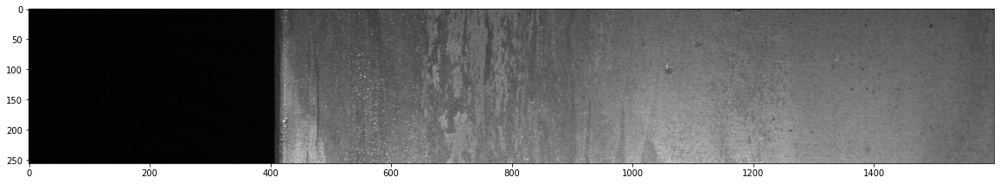

<AxesSubplot:>

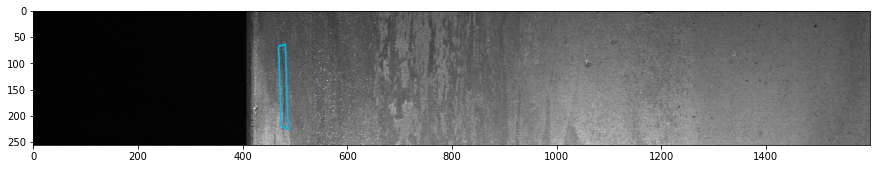

In [45]:
#Пример изображения с дефектом класса 2
filename='026183d85.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
plt.show()
show_masked_image(filename)

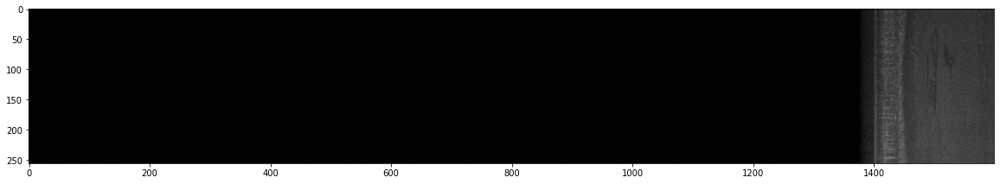

<AxesSubplot:>

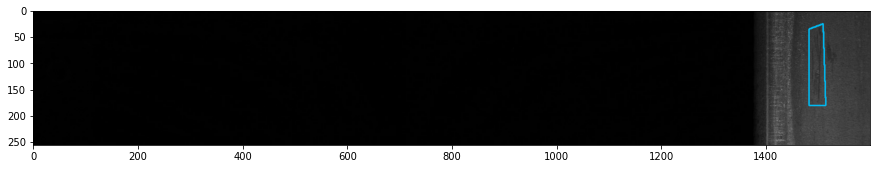

In [46]:
filename='068c6c4a9.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
plt.show()
show_masked_image(filename)

In [47]:
#Первые 10 изображений с дефектами класса 3
train_data[train_data['Defect_3']!=''].head(10)

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4,has_defect,number_of_defects
4,0007a71bf.jpg,,,18661 28 18863 82 19091 110 19347 110 19603 11...,,1,1
7,0014fce06.jpg,,,229501 11 229741 33 229981 55 230221 77 230468...,,1,1
11,0025bde0c.jpg,,,8458 14 8707 35 8963 48 9219 71 9475 88 9731 8...,315139 8 315395 15 315651 16 315906 17 316162 ...,1,2
17,0046839bd.jpg,,,152926 1 153180 4 153434 6 153689 8 153943 11 ...,,1,1
19,005d86c25.jpg,,,331 18 587 53 843 89 1099 124 1355 159 1611 17...,,1,1
22,005f02e20.jpg,,,318652 8 318863 6 318903 17 319114 15 319158 2...,,1,1
23,005f19695.jpg,,,123137 7 123393 19 123649 32 123905 44 124161 ...,,1,1
30,0088260da.jpg,,,26044 13 26283 40 26522 67 26762 92 27001 119 ...,,1,1
33,008d0f87b.jpg,,,72425 21 72641 61 72856 102 73071 142 73287 18...,,1,1
35,0095cd374.jpg,,,10674 18 10926 48 11178 52 11430 56 11682 60 1...,,1,1


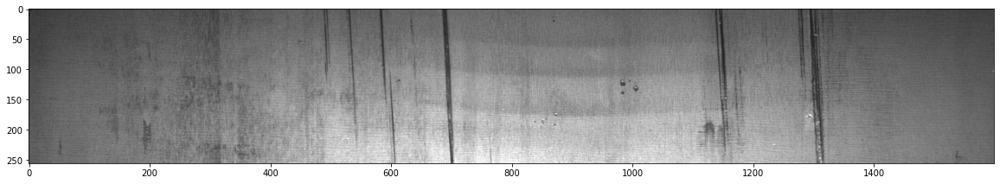

<AxesSubplot:>

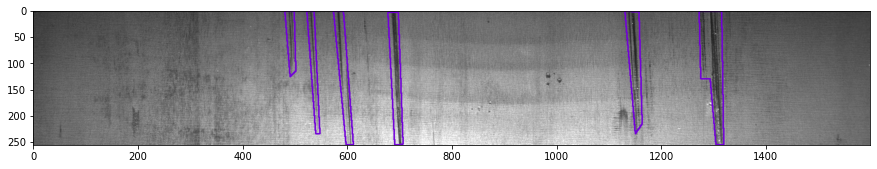

In [48]:
#Пример изображения с дефектом класса 3
filename='005f19695.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
plt.show()
show_masked_image(filename)

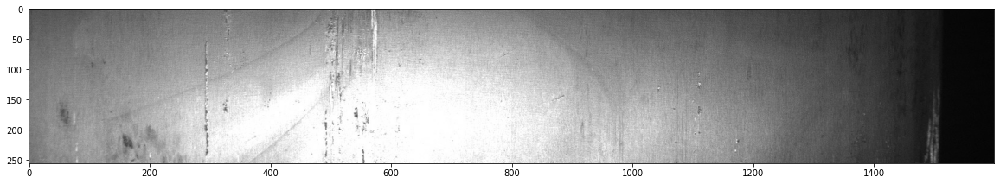

<AxesSubplot:>

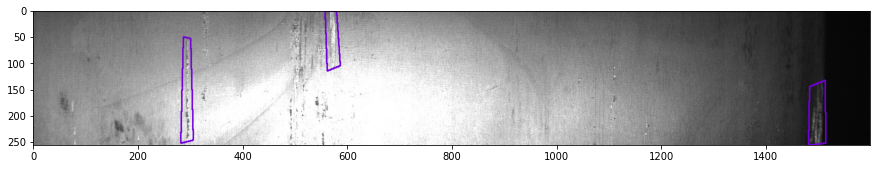

In [49]:
filename='008d0f87b.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
plt.show()
show_masked_image(filename)

In [50]:
#Первые 10 изображений с дефектами класса 4
train_data[train_data['Defect_4']!=''].head(10)

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4,has_defect,number_of_defects
6,000f6bf48.jpg,,,,131973 1 132228 4 132483 6 132738 8 132993 11 ...,1,1
11,0025bde0c.jpg,,,8458 14 8707 35 8963 48 9219 71 9475 88 9731 8...,315139 8 315395 15 315651 16 315906 17 316162 ...,1,2
12,002af848d.jpg,,,,290800 6 291055 13 291311 15 291566 18 291822 ...,1,1
15,0030401a5.jpg,,,,186833 1 187089 3 187344 6 187600 7 187855 10 ...,1,1
29,008621629.jpg,,,,215548 3 215798 9 216051 12 216306 13 216560 1...,1,1
64,012f26693.jpg,,,4396 14 4632 42 4878 61 5133 70 5388 76 5643 7...,35258 2 35513 5 35768 8 36023 11 36277 15 3653...,1,2
76,016efe618.jpg,,,,241 13 473 37 704 62 936 86 1179 100 1434 101 ...,1,1
81,018ccdfed.jpg,,,,195606 1 195860 4 196113 9 196366 13 196620 16...,1,1
86,01afbfa7a.jpg,,,,271962 1 272217 4 272473 6 272728 8 272983 11 ...,1,1
93,01cfacf80.jpg,,,299116 11 299350 33 299521 6 299582 57 299777 ...,10 82 139 18 265 149 521 150 776 152 1032 152 ...,1,2


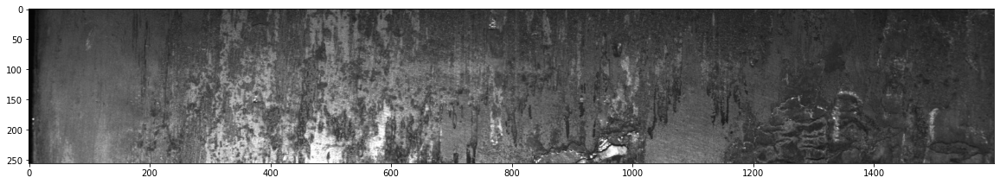

<AxesSubplot:>

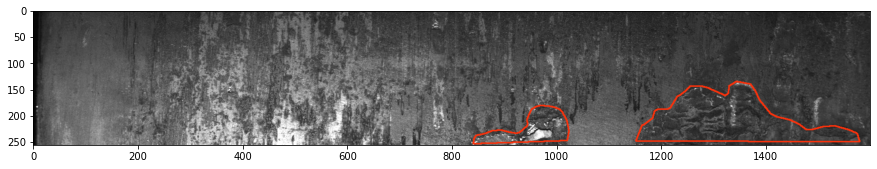

In [51]:
#Пример изображения с дефектом класса 4
filename='008621629.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
plt.show()
show_masked_image(filename)

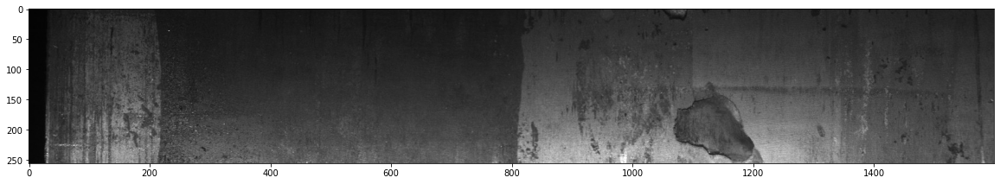

<AxesSubplot:>

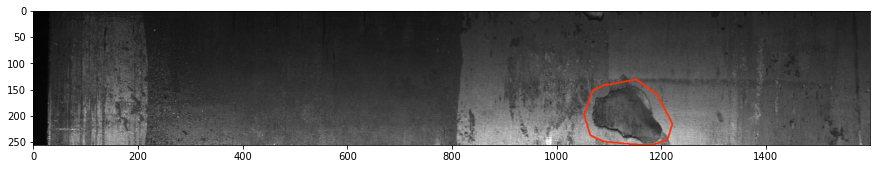

In [52]:
filename='038f14456.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
plt.show()
show_masked_image(filename)

### Размер mask для классов дефектов

Так как у нас бинарные masks (1 или 0), то мы можем посчитать число пикселей с дефектом (где 1) в маске, чтобы как-то оценить размер дефектов каждого класса и посмотреть как это зависит от класса дефекта. 

In [53]:
# Посчитаем сумму пикселей с 1 в маске для каждого класса (class id)
df_train['ClassId_str'] = df_train['ClassId'].astype(str)

df_train['mask_pixel_sum'] = df_train.apply(lambda x: rle_to_mask(x['EncodedPixels']).sum(), axis=1)

class_ids = [str(i) for i in range(1, 5)]
mask_count_per_class = [df_train[(df_train['ClassId_str']==class_id)&(df_train['mask_pixel_sum']!=0)]['mask_pixel_sum'].count() for class_id in class_ids]
pixel_sum_per_class = [df_train[(df_train['ClassId_str']==class_id)&(df_train['mask_pixel_sum']!=0)]['mask_pixel_sum'].sum() for class_id in class_ids]

In [54]:
mask_count_per_class

[897, 247, 5150, 801]

In [55]:
pixel_sum_per_class

[3912129, 834471, 131306899, 27533572]

In [56]:
df_train

,ImageId,ClassId,EncodedPixels,ClassId_str,mask_pixel_sum
0,0002cc93b.jpg,1,29102 12 29346 24 29602 24 29858 24 30114 24 3...,1,4396
1,0007a71bf.jpg,3,18661 28 18863 82 19091 110 19347 110 19603 11...,3,6897
2,000a4bcdd.jpg,1,37607 3 37858 8 38108 14 38359 20 38610 25 388...,1,8319
3,000f6bf48.jpg,4,131973 1 132228 4 132483 6 132738 8 132993 11 ...,4,69357
4,0014fce06.jpg,3,229501 11 229741 33 229981 55 230221 77 230468...,3,4851
...,...,...,...,...,...
7090,ffcf72ecf.jpg,3,121911 34 122167 101 122422 169 122678 203 122...,3,8903
7091,fff02e9c5.jpg,3,207523 3 207777 9 208030 15 208283 22 208537 2...,3,7206
7092,fffe98443.jpg,3,105929 5 106177 14 106424 24 106672 33 106923 ...,3,2336
7093,ffff4eaa8.jpg,3,16899 7 17155 20 17411 34 17667 47 17923 60 18...,3,23503


In [57]:
# Построим pie chart (справа - число изображений, содержащих дефекты данного класса)
# Слева - Суммарное число пикселей, содержащих дефекты данного класса
fig = plotly.subplots.make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])

fig.add_trace(go.Pie(labels=class_ids, values=mask_count_per_class, name="Mask Count"), 1, 1)
fig.add_trace(go.Pie(labels=class_ids, values=pixel_sum_per_class, name="Pixel Count"), 1, 2)
# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="Steel Defect Mask & Pixel Count",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Count', x=0.18, y=0.5, font_size=20, showarrow=False),
                 dict(text='Sum', x=0.80, y=0.5, font_size=20, showarrow=False)])
fig['layout'].update(height=400, width=900, title='Pixel count and sum per class mask', legend={'traceorder':'normal'})
fig.show()

In [58]:
# Построим гистограмму и box plot
fig = px.histogram(df_train[df_train['mask_pixel_sum']!=0][['ClassId','mask_pixel_sum']], 
                   x="mask_pixel_sum", y="ClassId", color="ClassId", marginal="box")

fig['layout'].update(height=400, width=900,title='Histogram and Boxplot of Sum of Mask Pixels Per Class')
fig.show()

Из гистограммы и box plot можно подтвердить, что дефекты класса 4 обычно больше по размеру, чем дефекты класса 3, и очевидно дефекты классов 1 и 2. Дефекты класса 3 содержат больше outliers. </br>

Несмотря на то, что дефекты класса 4 обычно больше по размеру, чем дефекты класса 3, outliers класса 3 могут значительно превышать по размеру дефекты класса 4. 

## Modelling

In [14]:
import tensorflow.keras as keras

In [15]:
path=source_folder+'/'

In [16]:
class DataGenerator(keras.utils.Sequence):
    def __init__(self, df, batch_size = 16, subset="train", shuffle=False, preprocess=None, info={}):
        super().__init__()
        self.df = df
        self.shuffle = shuffle
        self.subset = subset
        self.batch_size = batch_size
        self.preprocess = preprocess
        self.info = info
        
        if self.subset == "train":
            self.data_path = os.path.join(source_folder,'train_images/')
        elif self.subset == "test":
            self.data_path = os.path.join(source_folder,'test_images/')
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.df) / self.batch_size))
    
    def on_epoch_end(self):
        self.indexes = np.arange(len(self.df))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)
    
    def __getitem__(self, index): 
        X = np.empty((self.batch_size,128,800,3),dtype=np.float32)
        y = np.empty((self.batch_size,128,800,4),dtype=np.int8)
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        for i,f in enumerate(self.df['ImageId'].iloc[indexes]):
            self.info[index*self.batch_size+i]=f
            X[i,] = Image.open(os.path.join(self.data_path, f)).resize((800,128))
            if self.subset == 'train': 
                for j in range(4):
                    y[i,:,:,j] = rle2maskResize(self.df['Defect_'+str(j+1)].iloc[indexes[i]])
        if self.preprocess!=None: X = self.preprocess(X)
        if self.subset == 'train': return X, y
        else: return X

In [17]:
def rle2maskResize(rle):
    """
    Convert run length encoding to mask
    """
    if (pd.isnull(rle))|(rle==''): 
        return np.zeros((128,800) ,dtype=np.uint8)
    
    height= 256
    width = 1600
    mask= np.zeros( width*height ,dtype=np.uint8)

    array = np.asarray([int(x) for x in rle.split()])
    starts = array[0::2]-1
    lengths = array[1::2]    
    for index, start in enumerate(starts):
        mask[int(start):int(start+lengths[index])] = 1
    
    return mask.reshape( (height,width), order='F' )[::2,::2]

In [18]:
def mask2contour(mask, width=3):
    """
    Convert mask to its contour
    """
    w = mask.shape[1]
    h = mask.shape[0]
    mask2 = np.concatenate([mask[:,width:],np.zeros((h,width))],axis=1)
    mask2 = np.logical_xor(mask,mask2)
    mask3 = np.concatenate([mask[width:,:],np.zeros((width,w))],axis=0)
    mask3 = np.logical_xor(mask,mask3)
    return np.logical_or(mask2,mask3)

In [64]:
def mask2pad(mask, pad=2):
    """
    Enlarge Mask to include more space around the defect
    """
    w = mask.shape[1]
    h = mask.shape[0]
    
    # MASK UP
    for k in range(1,pad,2):
        temp = np.concatenate([mask[k:,:],np.zeros((k,w))],axis=0)
        mask = np.logical_or(mask,temp)
    # MASK DOWN
    for k in range(1,pad,2):
        temp = np.concatenate([np.zeros((k,w)),mask[:-k,:]],axis=0)
        mask = np.logical_or(mask,temp)
    # MASK LEFT
    for k in range(1,pad,2):
        temp = np.concatenate([mask[:,k:],np.zeros((h,k))],axis=1)
        mask = np.logical_or(mask,temp)
    # MASK RIGHT
    for k in range(1,pad,2):
        temp = np.concatenate([np.zeros((h,k)),mask[:,:-k]],axis=1)
        mask = np.logical_or(mask,temp)
    
    return mask 

In [65]:
train_data.head()

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4,has_defect,number_of_defects
0,0002cc93b.jpg,29102 12 29346 24 29602 24 29858 24 30114 24 3...,,,,1,1
1,00031f466.jpg,,,,,0,0
2,000418bfc.jpg,,,,,0,0
3,000789191.jpg,,,,,0,0
4,0007a71bf.jpg,,,18661 28 18863 82 19091 110 19347 110 19603 11...,,1,1


In [66]:
train_data.shape

(7872, 7)

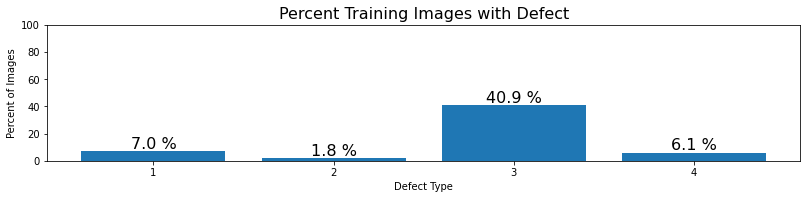

In [67]:
plt.figure(figsize=(13.5,2.5))
bar = plt.bar( [1,2,3,4],100*np.mean( train_data.iloc[:,1:5]!='',axis=0) )
plt.title('Percent Training Images with Defect', fontsize=16)
plt.ylabel('Percent of Images'); plt.xlabel('Defect Type')
plt.xticks([1,2,3,4])
for rect in bar:
    height = rect.get_height()
    plt.text(rect.get_x() + rect.get_width()/2.0, height, '%.1f %%' % height,
             ha='center', va='bottom',fontsize=16)
plt.ylim((0,100)); plt.show()

In [68]:
# DEFECTIVE IMAGE SAMPLES
filenames = {}
defects = list(train_data[train_data['Defect_1']!=''].sample(3).index)
defects += list(train_data[train_data['Defect_2']!=''].sample(3).index)
defects += list(train_data[train_data['Defect_3']!=''].sample(7).index)
defects += list(train_data[train_data['Defect_4']!=''].sample(3).index)

In [69]:
# DATA GENERATOR
train_batches = DataGenerator(train_data[train_data.index.isin(defects)],shuffle=True,info=filenames)
print('Images and masks from our Data Generator')
print('KEY: yellow=defect1, green=defect2, blue=defect3, magenta=defect4')

Images and masks from our Data Generator
KEY: yellow=defect1, green=defect2, blue=defect3, magenta=defect4


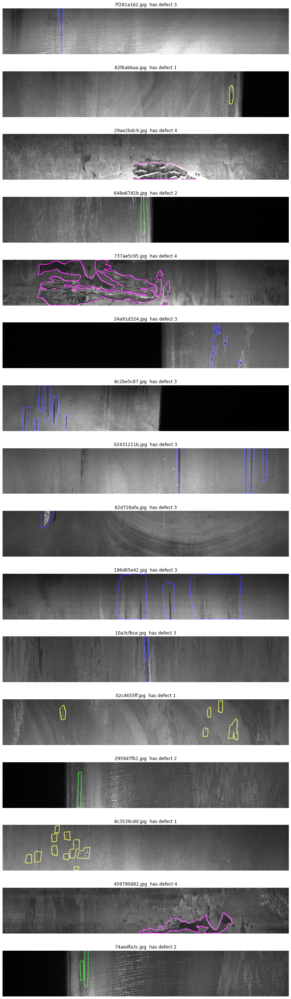

In [70]:
# DISPLAY IMAGES WITH DEFECTS
for i,batch in enumerate(train_batches):
    plt.figure(figsize=(14,50)) #20,18
    for k in range(16):
        plt.subplot(16,1,k+1)
        img = batch[0][k,]
        img = Image.fromarray(img.astype('uint8'))
        img = np.array(img)
        extra = '  has defect'
        for j in range(4):
            msk = batch[1][k,:,:,j]
            msk = mask2pad(msk,pad=3)
            msk = mask2contour(msk,width=2)
            if np.sum(msk)!=0: extra += ' '+str(j+1)
            if j==0: # yellow
                img[msk==1,0] = 235 
                img[msk==1,1] = 235
            elif j==1: img[msk==1,1] = 210 # green
            elif j==2: img[msk==1,2] = 255 # blue
            elif j==3: # magenta
                img[msk==1,0] = 255
                img[msk==1,2] = 255
        plt.title(filenames[16*i+k]+extra)
        plt.axis('off') 
        plt.imshow(img)
    plt.subplots_adjust(wspace=0.05)
    plt.show()

In [2]:
from keras import backend as K
def dice_coef(y_true, y_pred, smooth=1):
    """
    Compute Dice Coefficient
    """
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

Using TensorFlow backend.


In [72]:
%pip install segmentation_models

Defaulting to user installation because normal site-packages is not writeable


In [73]:
%env SM_FRAMEWORK=tf.keras
from segmentation_models import Unet

env: SM_FRAMEWORK=tf.keras
Segmentation Models: using `tf.keras` framework.


Using TensorFlow backend.


Segmentation Models: using `keras` framework.
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where

Epoch 1/100
Epoch 1/100
393/393 - 179s - loss: 0.0779 - dice_coef: 0.0963 - val_loss: 0.0322 - val_dice_coef: 0.1871
Epoch 2/100
Epoch 1/100
393/393 - 133s - loss: 0.0237 - dice_coef: 0.2459 - val_loss: 0.0290 - val_dice_coef: 0.1971
Epoch 3/100
Epoch 1/100
393/393 - 130s - loss: 0.0209 - dice_coef: 0.3014 - val_loss: 0.0301 - val_dice_coef: 0.2790
Epoch 4/100
Epoch 1/100
393/393 - 131s - loss: 0.0195 - dice_coef: 0.3395 - val_loss: 0.0222 - val_dice_coef: 0.3273
Epoch 5/100
Epoch 1/100
393/393 - 131s - loss: 0.0187 - dice_coef: 0.3666 - val_loss: 0.0238 - val_dice_coef: 0.3693
Epoch 6/100
Epoch 1/100
393/393 - 133s - loss: 0.0179 - dice_coef: 0.3826 - val_loss: 0.0176 - val_dice_coef: 0.4251
Epoch 7/100
Epoch 1/100
393/393 - 136s - loss: 0.0167 - dice_coef: 0.4159 - 

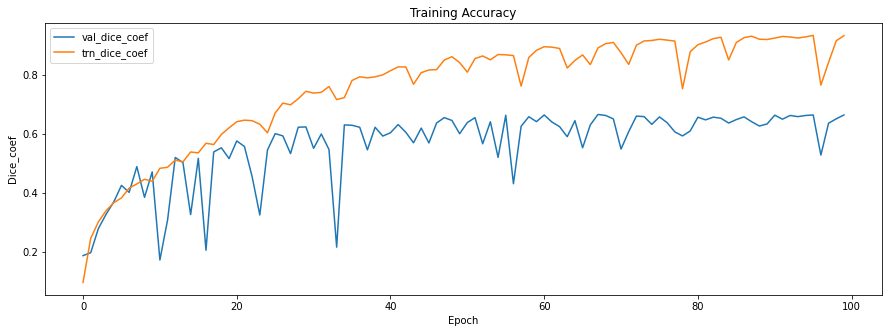

In [74]:
#!L
# Load U-Net pretrained from ImageNet
%enable_full_walk
model = Unet('resnet50', input_shape=(128, 800, 3), classes=4, activation='sigmoid')
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coef])
#model.summary()
# Train and validate the model
idx = int(0.8*len(train_data)); print()
train_batches = DataGenerator(train_data.iloc[:idx],shuffle=True)
valid_batches = DataGenerator(train_data.iloc[idx:])
history = model.fit_generator(train_batches, validation_data = valid_batches, epochs = 100, verbose=2)
# SAVE MODEL
model.save('UNET50.h5')
# Plot training
plt.figure(figsize=(15,5))
plt.plot(range(history.epoch[-1]+1),history.history['val_dice_coef'],label='val_dice_coef')
plt.plot(range(history.epoch[-1]+1),history.history['dice_coef'],label='trn_dice_coef')
plt.title('Training Accuracy'); plt.xlabel('Epoch'); plt.ylabel('Dice_coef');plt.legend(); 
plt.show()

2/2 [==============================] - 2s 903ms/step
Plotting predictions...
KEY: yellow=defect1, green=defect2, blue=defect3, magenta=defect4


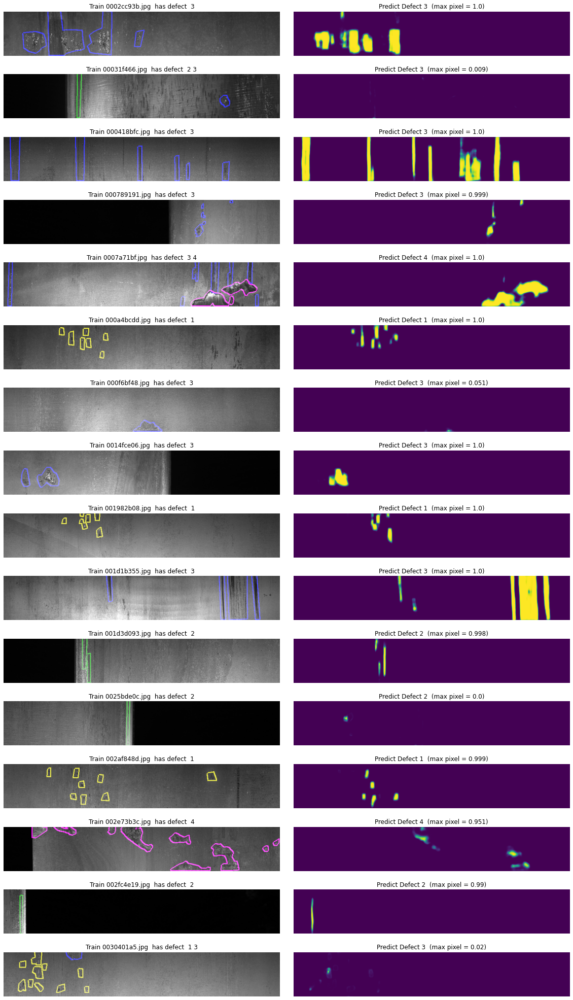

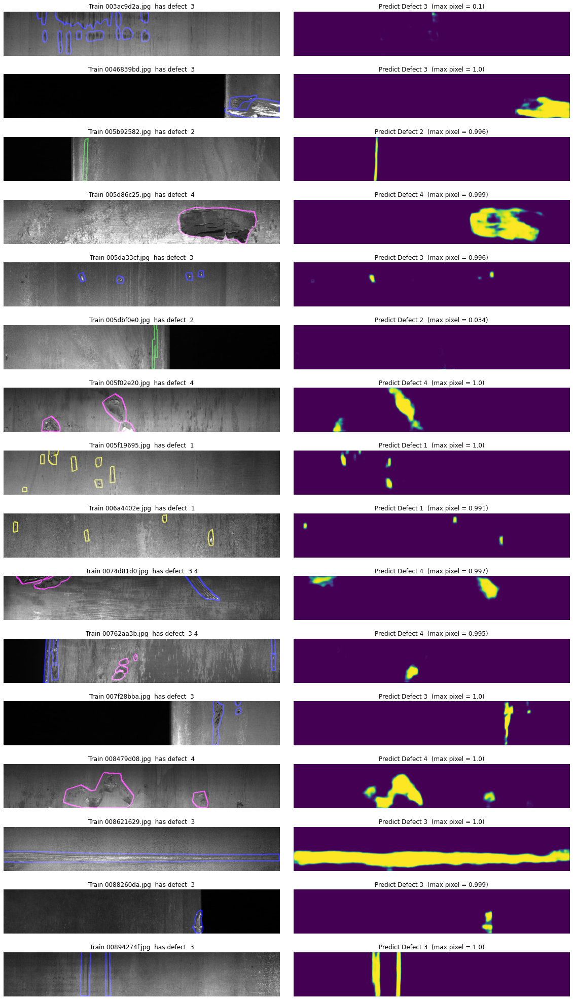

In [75]:
#!L
# PREDICT FROM VALIDATION SET
%enable_full_walk
val_set = train_data.iloc[idx:];
defects = list(val_set[val_set['Defect_1']!=''].sample(6).index)
defects += list(val_set[val_set['Defect_2']!=''].sample(6).index)
defects += list(val_set[val_set['Defect_3']!=''].sample(14).index)
defects += list(val_set[val_set['Defect_4']!=''].sample(6).index)

valid_batches = DataGenerator(val_set[val_set.index.isin(defects)])
preds = model.predict_generator(valid_batches,verbose=1)
# PLOT PREDICTIONS
valid_batches = DataGenerator(val_set[val_set.index.isin(defects)])
print('Plotting predictions...')
print('KEY: yellow=defect1, green=defect2, blue=defect3, magenta=defect4')

for i,batch in enumerate(valid_batches):
    plt.figure(figsize=(20,36))
    for k in range(16):
        plt.subplot(16,2,2*k+1)
        img = batch[0][k,]
        img = Image.fromarray(img.astype('uint8'))
        img = np.array(img)
        dft = 0
        extra = '  has defect '
        for j in range(4):
            msk = batch[1][k,:,:,j]
            if np.sum(msk)!=0: 
                dft=j+1
                extra += ' '+str(j+1)
            msk = mask2pad(msk,pad=2)
            msk = mask2contour(msk,width=3)
            if j==0: # yellow
                img[msk==1,0] = 235 
                img[msk==1,1] = 235
            elif j==1: img[msk==1,1] = 210 # green
            elif j==2: img[msk==1,2] = 255 # blue
            elif j==3: # magenta
                img[msk==1,0] = 255
                img[msk==1,2] = 255
        if extra=='  has defect ': extra =''
        plt.title('Train '+train_data.iloc[16*i+k,0]+extra)
        plt.axis('off') 
        plt.imshow(img)
        plt.subplot(16,2,2*k+2) 
        if dft!=0:
            msk = preds[16*i+k,:,:,dft-1]
            plt.imshow(msk)
        else:
            plt.imshow(np.zeros((128,800)))
        plt.axis('off')
        mx = np.round(np.max(msk),3)
        plt.title('Predict Defect '+str(dft)+'  (max pixel = '+str(mx)+')')
    plt.subplots_adjust(wspace=0.05)
    plt.show()
    

We will plot histograms showing the predicted size of each defect mask. We would hope that if an image does not have a particular defect then UNET would not predict a mask (i.e. predict less than 250 pixel mask). This is not the case. When UNET predicts a mask when a defect isn't present, we call that an "incorrect" mask. When UNET predicts a mask when a defect is present, we call that a "correct" mask. If UNET predicts less than 250 pixels, we will treat that as no mask predicted. Let's compare the distribution of "incorrect" versus "correct" masks for each defect type.

UNET outputs masks using all floating point values between 0 and 1 inclusive. For this classification problem, we need to use only integer 0 and 1. Therefore we must convert mask floating points into integers using a threshold. If pixel>=THRESHOLD then pixel=1 else pixel=0. We will plot histograms for various thresholds below. We will consider all masks with less than 250 pixels as empty masks (where pixel_count = 4 * pixel count on 128x800).

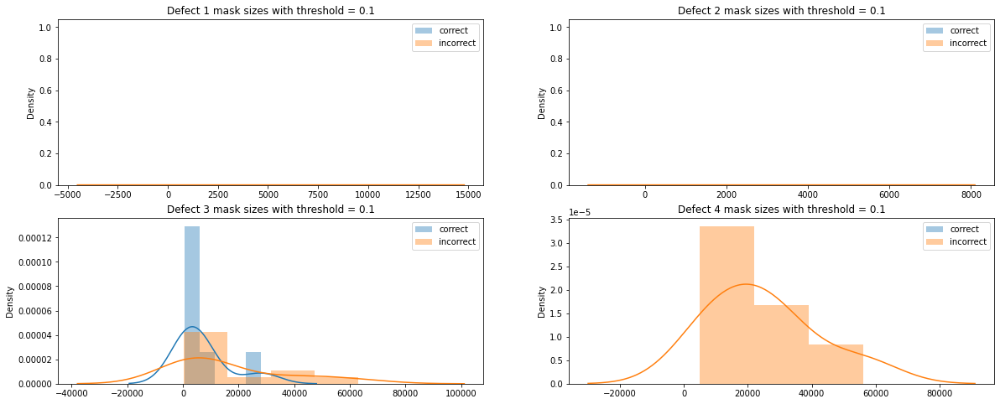

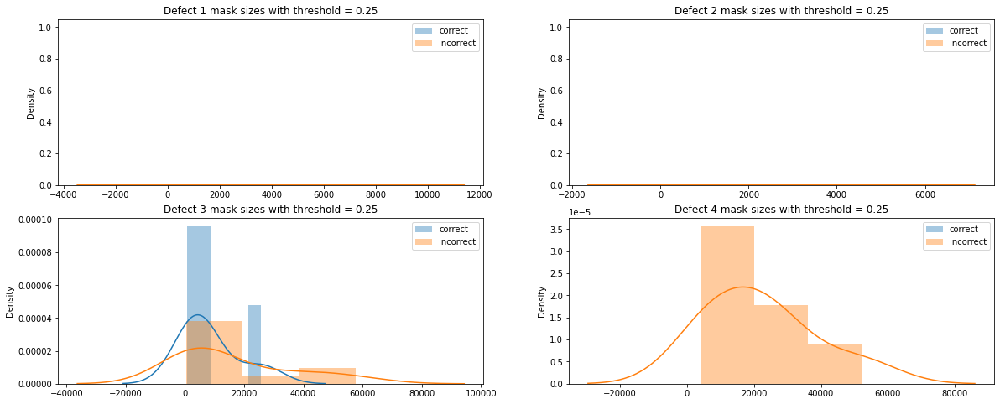

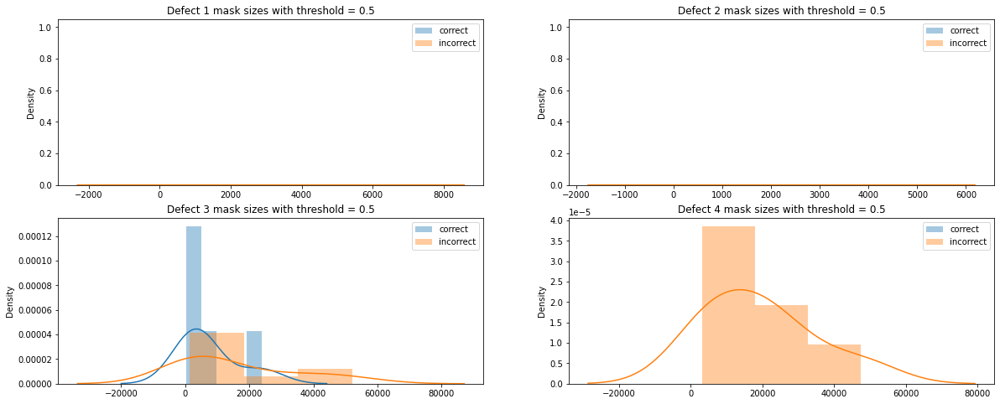

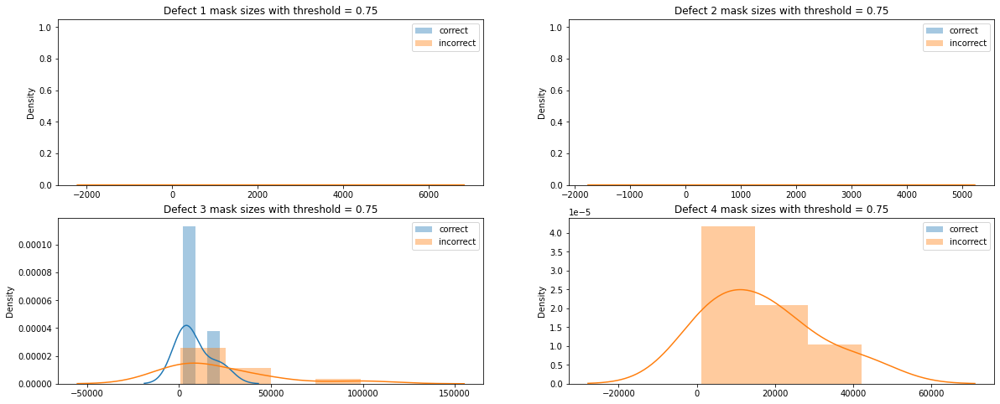

/home/jupyter/.local/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/jupyter/.local/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/home/jupyter/.local/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/jupyter/.local/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distp

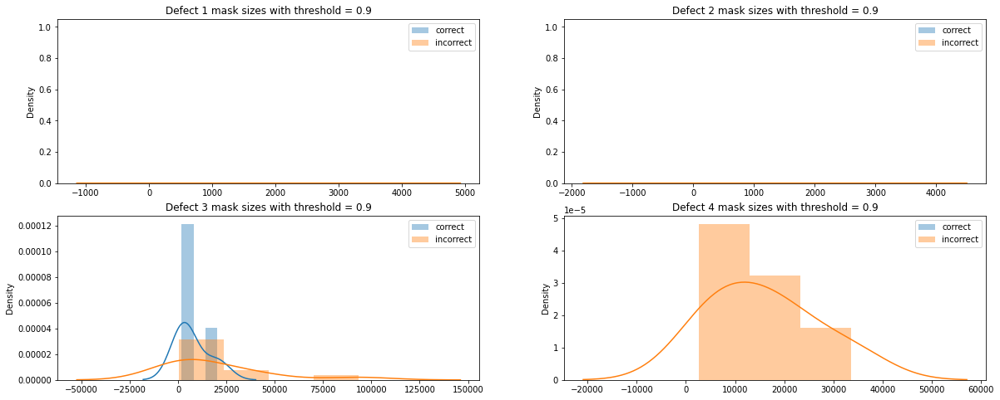

######################################
## Threshold = 0.1 displayed below ##
######################################
With threshold = 0.1 , defect 1 has 1 correct and 11 incorrect masks
With threshold = 0.1 , defect 2 has 1 correct and 3 incorrect masks
With threshold = 0.1 , defect 3 has 7 correct and 13 incorrect masks
With threshold = 0.1 , defect 4 has 0 correct and 7 incorrect masks

######################################
## Threshold = 0.25 displayed below ##
######################################
With threshold = 0.25 , defect 1 has 1 correct and 10 incorrect masks
With threshold = 0.25 , defect 2 has 1 correct and 3 incorrect masks
With threshold = 0.25 , defect 3 has 5 correct and 12 incorrect masks
With threshold = 0.25 , defect 4 has 0 correct and 7 incorrect masks

######################################
## Threshold = 0.5 displayed below ##
######################################
With threshold = 0.5 , defect 1 has 1 correct and 9 incorrect masks
With threshold = 0.5 , defect

In [123]:
#!L
# PLOT RESULTS
import seaborn as sns
pix_min = 250
for THRESHOLD in [0.1, 0.25, 0.50, 0.75, 0.9]:
    print('######################################')
    print('## Threshold =',THRESHOLD,'displayed below ##')
    print('######################################')
    correct=[[],[],[],[]]; incorrect=[[],[],[],[]]
    for i,f in enumerate(train_data.iloc[idx:idx+len(preds)]['ImageId']):
        preds2 = preds[i].copy()
        preds2[preds2>=THRESHOLD]=1
        preds2[preds2<THRESHOLD]=0
        sums = np.sum(preds2,axis=(0,1))
        for j in range(4):
            if 4*sums[j]<pix_min: continue
            if train_data.iloc[i,j+1]=='': incorrect[j].append(4*sums[j])
            else: correct[j].append(4*sums[j])
    plt.figure(figsize=(20,8))
    for j in range(4):
        limit = [10000,10000,100000,100000][j]
        plt.subplot(2,2,j+1)
        sns.distplot([x for x in correct[j] if x<limit], label = 'correct')
        sns.distplot([x for x in incorrect[j] if x<limit], label = 'incorrect')
        plt.title('Defect '+str(j+1)+' mask sizes with threshold = '+str(THRESHOLD)); plt.legend()
    plt.show()
    for j in range(4):
        c1 = np.array(correct[j])
        c2 = np.array(incorrect[j])
        print('With threshold =',THRESHOLD,', defect',j+1,'has',len(c1[c1!=0]),'correct and',len(c2[c2!=0]),'incorrect masks')
    print()

In [19]:
# LOAD MODEL
%enable_full_walk
from tensorflow.keras.models import load_model
def dice_coef(y_true, y_pred, smooth=1):
    """
    Compute Dice Coefficient
    """
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
model = load_model('UNET50.h5',custom_objects={'dice_coef':dice_coef})

# PREDICT 1 BATCH TEST DATASET
# test['ImageId'] = test['ImageId_ClassId'].map(lambda x: x.split('_')[0])
test_batches = DataGenerator(df_sample.iloc[::4],subset='test')
test_preds = model.predict_generator(test_batches,verbose=1)

86/86 [==============================] - 440s 5s/step


In [ ]:
#!L

submission_entries = []

if make_submission:
    for test_batch, image_ids in test_generator:
        pred_batch = model.predict(test_batch)

        for i, img_id in enumerate(image_ids):
            for j in range(0, 4):
                lre_mask = process_pred_mask(pred_batch[i, ..., j])
                submission_entries.append((f'{img_id}_{j+1}', lre_mask))
#         break
        del test_batch
        del pred_batch
                
submission = pd.DataFrame(submission_entries, columns=['ImageId_ClassId', 'EncodedPixels'])

In [ ]:
#!L
test_preds
test.iloc[::4]

In [ ]:
#!L

test_preds[0][0][0]

In [ ]:
#!L
rle1=[]
rle2=[]
rle3=[]
rle4=[]
for i,batch in enumerate(test_batches):
    for k in range(16):
        msk = test_preds[16*i+k,:,:,:]
        rle1.append(mask_to_rle(msk[:,:,0]))
        rle2.append(mask_to_rle(msk[:,:,1]))
        rle3.append(mask_to_rle(msk[:,:,2]))
        rle4.append(mask_to_rle(msk[:,:,3]))

In [110]:
#!L
mask_to_contour(test_preds[0,:,:,0])

ValueError: operands could not be broadcast together with shapes (10966,) (10967,) (10966,) 

In [122]:
#!L
mask_to_rle(np.array(test_preds[2,:,:,0]))

ValueError: operands could not be broadcast together with shapes (11742,) (11743,) (11742,) 

In [120]:
#!L
mask_to_rle(np.array([[0,1,3],[0,1,2],[0,0,0],[4,3,8]]))

'2 1 4 1 6 1 10 1 12 1'

In [ ]:
#!L
